In [1]:
import pandas as pd

onnx_df = pd.read_parquet("onnx_inference_results.parquet")
pytorch_df = pd.read_parquet("pytorch_inference_results.parquet")

In [2]:
df = pd.merge(onnx_df, pytorch_df, on="filename", suffixes=("_onnx", "_pytorch"))

df.head()

,filename,english_tags_onnx,chinese_tags_onnx,english_tags_pytorch,chinese_tags_pytorch
0,422d485946a706ac.jpg,"[bulletin board, meeting, conversation, table,...","[公告栏, 会议, 交谈, 桌子/表格, 收集, 聚集, 人, 房间, 坐/放置/坐落, 扬...","[bulletin board, classroom, table, collect, pe...","[公告栏, 教室, 桌子/表格, 收集, 人, 演讲, 投影仪, 学生, 房间, 研讨会, ..."
1,5afb795be02a3c4f.jpg,"[ceiling fan, chair, curtain, table, dinning t...","[吊扇, 椅子, 窗帘, 桌子/表格, 餐桌, 填满, 绿色植物, 室内植物, 植物, 锅/...","[lamp, chair, corner, curtain, table, dinning ...","[灯, 椅子, 角落, 窗帘, 桌子/表格, 餐桌, 填满, 绿色植物, 室内植物, 厨房窗..."
2,0d6a5334a8ca4185.jpg,"[bead, bulletin board, display, earring, jewel...","[珠子, 公告栏, 展示, 耳环, 珠宝, 珠宝店, 项链, 房间, 陈列柜, 标志, 摊位...","[bracelet, bulletin board, display, earring, j...","[手镯, 公告栏, 展示, 耳环, 珠宝, 珠宝店, 项链, 陈列柜, 标志, 商店, 手写..."
3,157367e738d106db.jpg,"[automobile model, black, canopy, car, license...","[汽车模型, 黑色, 树冠/顶棚, 车, 车牌, 小型货车, 公园, 停车场, 边缘, 小轿...","[black, canopy, car, pillar, garage, license p...","[黑色, 树冠/顶棚, 车, 柱子, 车库, 车牌, 公园, 停车场, 小轿车, 越野车, 车辆]"
4,b5a1eb1713ff41c4.jpg,"[swimwear, beach, board, paddle, boy, child, l...","[泳装, 海滩, 板子, 桨, 男孩, 孩子, 学习, 海洋, 玩/演奏/运动, 沙子, 站...","[beach, board, paddle, boy, child, learn, play...","[海滩, 板子, 桨, 男孩, 孩子, 学习, 玩/演奏/运动, 沙子, 站/矗立/摊位, ..."


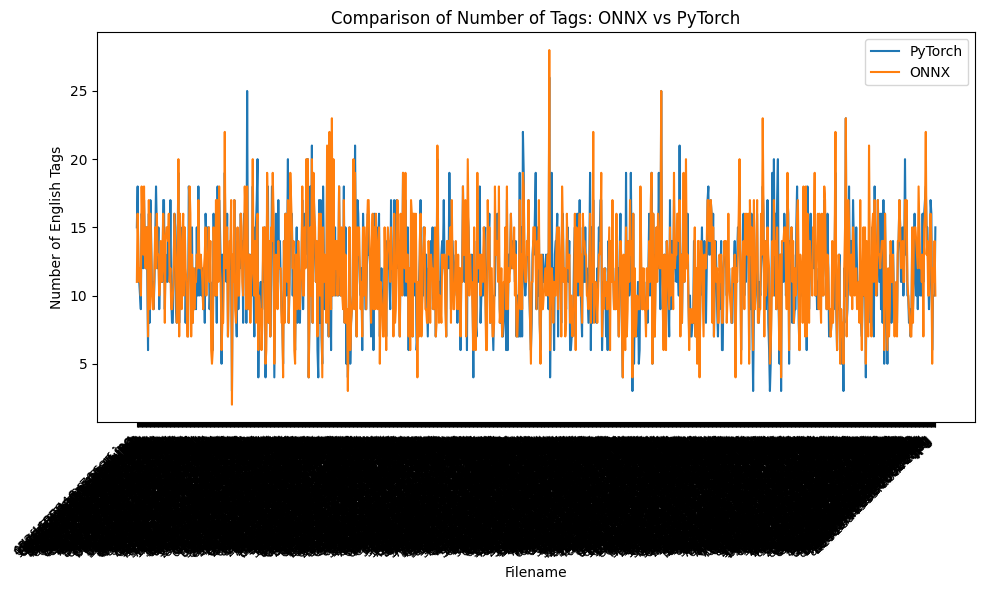

In [3]:
import matplotlib.pyplot as plt

# Calculate the number of tags for each file
df['num_tags_onnx'] = df['english_tags_onnx'].apply(len)
df['num_tags_pytorch'] = df['english_tags_pytorch'].apply(len)

plt.figure(figsize=(10, 6))
plt.plot(df['filename'], df['num_tags_pytorch'], label='PyTorch')
plt.plot(df['filename'], df['num_tags_onnx'], label='ONNX')

plt.xlabel('Filename')
plt.ylabel('Number of English Tags')
plt.title('Comparison of Number of Tags: ONNX vs PyTorch')
plt.legend()
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

/tmp/ipykernel_81365/1616331025.py:36: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  ax2.boxplot([df['num_tags_onnx'], df['num_tags_pytorch']], labels=['ONNX', 'PyTorch'])


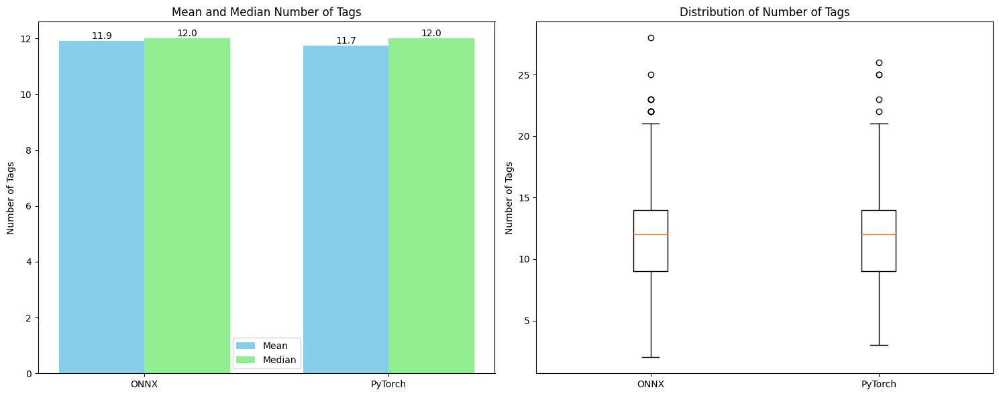

Statistics:
{'mean': num_tags_onnx       11.900
num_tags_pytorch    11.745
dtype: float64, 'median': num_tags_onnx       12.0
num_tags_pytorch    12.0
dtype: float64, 'std': num_tags_onnx       3.613455
num_tags_pytorch    3.607907
dtype: float64}

Percentage of cases where ONNX has more tags: 42.20%


In [4]:
import matplotlib.pyplot as plt
import numpy as np

# Calculate the number of tags for each file
df['num_tags_onnx'] = df['english_tags_onnx'].apply(len)
df['num_tags_pytorch'] = df['english_tags_pytorch'].apply(len)

# Calculate statistics
stats = {
    'mean': df[['num_tags_onnx', 'num_tags_pytorch']].mean(),
    'median': df[['num_tags_onnx', 'num_tags_pytorch']].median(),
    'std': df[['num_tags_onnx', 'num_tags_pytorch']].std()
}

# Plot
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 6))

# Bar plot for mean and median
x = np.arange(2)
width = 0.35
ax1.bar(x - width/2, stats['mean'], width, label='Mean', color='skyblue')
ax1.bar(x + width/2, stats['median'], width, label='Median', color='lightgreen')
ax1.set_ylabel('Number of Tags')
ax1.set_title('Mean and Median Number of Tags')
ax1.set_xticks(x)
ax1.set_xticklabels(['ONNX', 'PyTorch'])
ax1.legend()

# Add value labels on the bars
for i, v in enumerate(stats['mean']):
    ax1.text(i - width/2, v, f'{v:.1f}', ha='center', va='bottom')
for i, v in enumerate(stats['median']):
    ax1.text(i + width/2, v, f'{v:.1f}', ha='center', va='bottom')

# Box plot
ax2.boxplot([df['num_tags_onnx'], df['num_tags_pytorch']], labels=['ONNX', 'PyTorch'])
ax2.set_ylabel('Number of Tags')
ax2.set_title('Distribution of Number of Tags')

plt.tight_layout()
plt.show()

# Print additional statistics
print("Statistics:")
print(stats)

# Calculate and print the percentage of cases where ONNX has more tags
onnx_more = (df['num_tags_onnx'] > df['num_tags_pytorch']).mean() * 100
print(f"\nPercentage of cases where ONNX has more tags: {onnx_more:.2f}%")

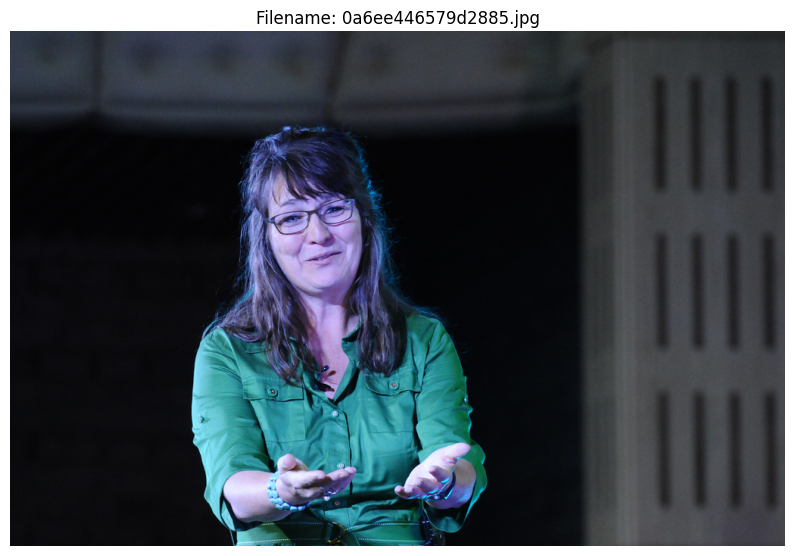

Filename: sample_images/0a6ee446579d2885.jpg

Common Tags:
cup, dress, green, hand, shirt, stand, stool, wear, woman

Tags only in ONNX:
catch, dark

Tags only in PyTorch:
belt, clasp, pillar

Number of ONNX tags: 11
Number of PyTorch tags: 12


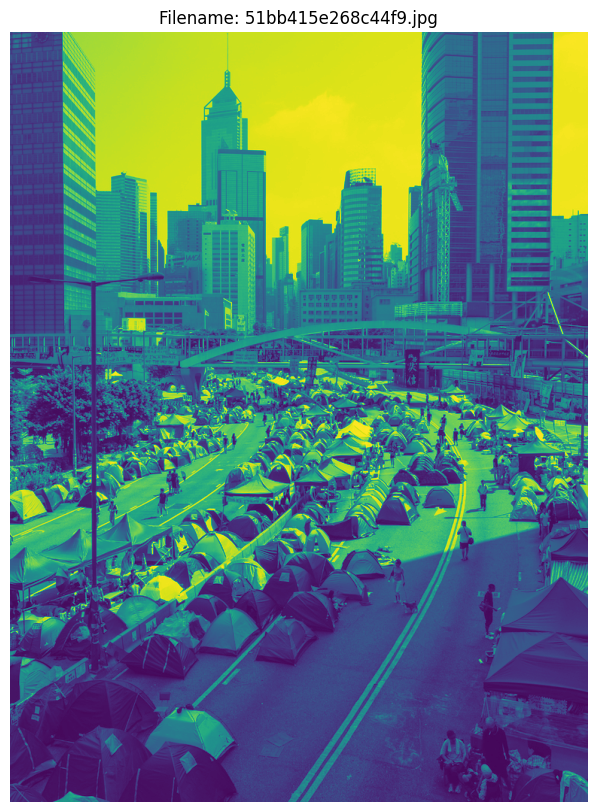

Filename: sample_images/51bb415e268c44f9.jpg

Common Tags:
black, camp, city, city skyline, city view, crowded, fill, person, photo, road, tent, urban, white

Tags only in ONNX:
canopy, umbrella

Tags only in PyTorch:
skyscraper

Number of ONNX tags: 15
Number of PyTorch tags: 14


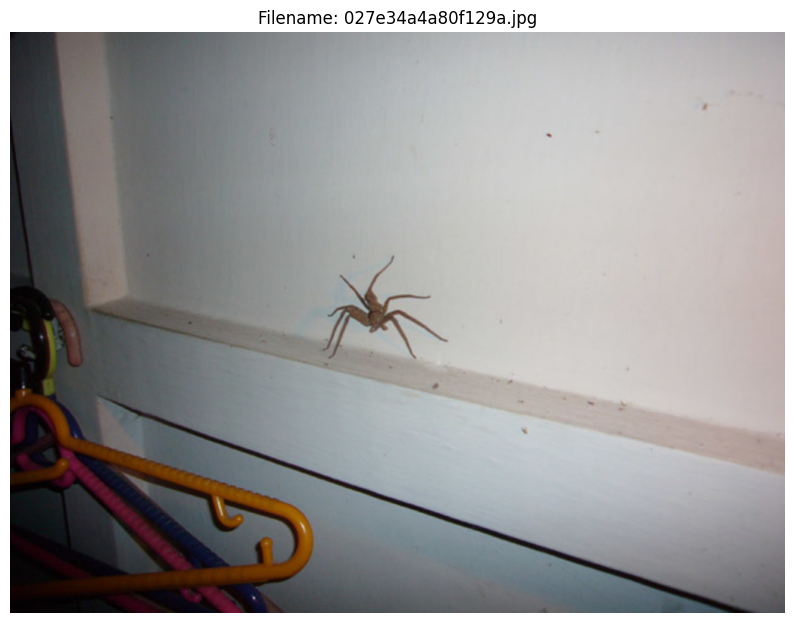

Filename: sample_images/027e34a4a80f129a.jpg

Common Tags:
bug, hanger, insect, ledge, spider, window sill

Tags only in ONNX:
bathroom, hook, wall

Tags only in PyTorch:
window

Number of ONNX tags: 9
Number of PyTorch tags: 7


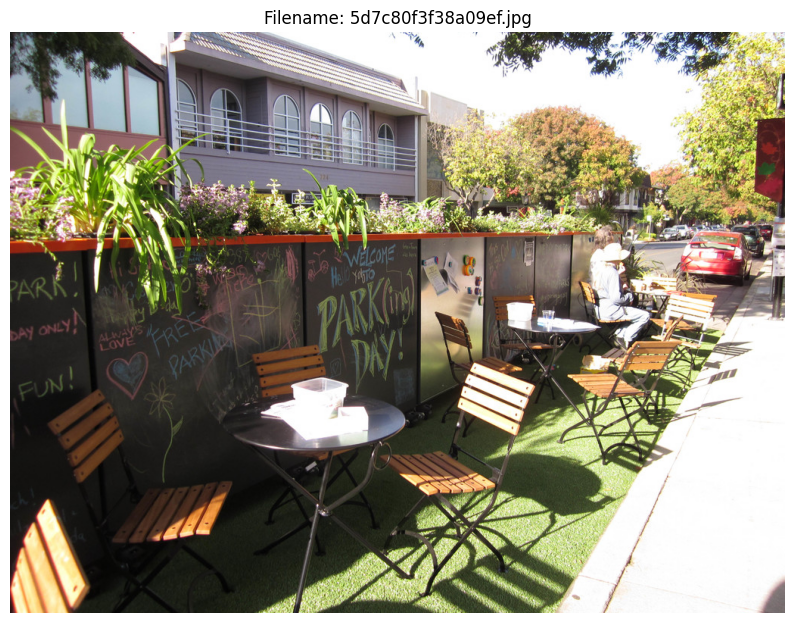

Filename: sample_images/5d7c80f3f38a09ef.jpg

Common Tags:
bulletin board, chair, grass, outdoor, pavement, stool, table, terrace

Tags only in ONNX:
bench, building, cafe, plant

Tags only in PyTorch:
blanket, wall, writing

Number of ONNX tags: 12
Number of PyTorch tags: 11


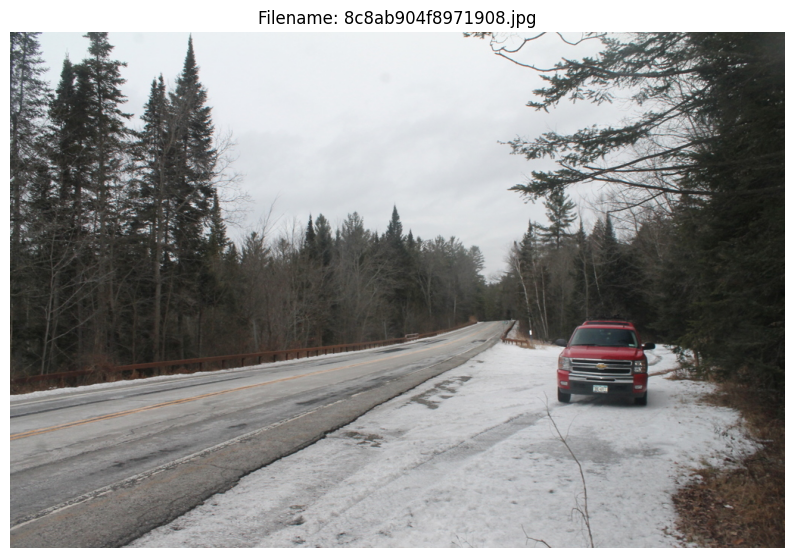

Filename: sample_images/8c8ab904f8971908.jpg

Common Tags:
blanket, car, drive, highway, pick up, red, road, snow, snowy, suv, travel, truck

Tags only in ONNX:
rural, tree

Tags only in PyTorch:
license plate

Number of ONNX tags: 14
Number of PyTorch tags: 13


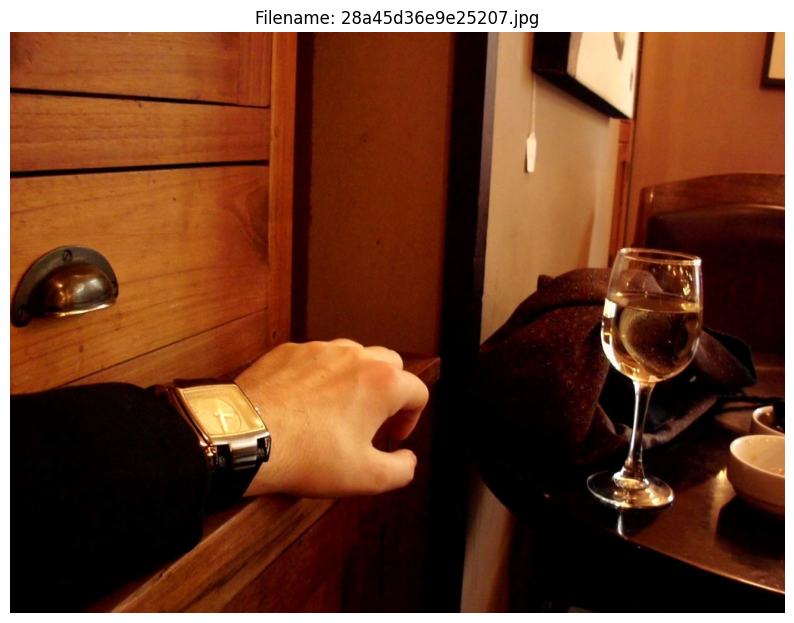

Filename: sample_images/28a45d36e9e25207.jpg

Common Tags:
alcohol, bureau, cabinet, champagne, closet, cup, door handle, drawer, dresser, hand, man, person, watch, wine, wine glass

Tags only in ONNX:
catch, open

Tags only in PyTorch:
food, table, tray

Number of ONNX tags: 17
Number of PyTorch tags: 18


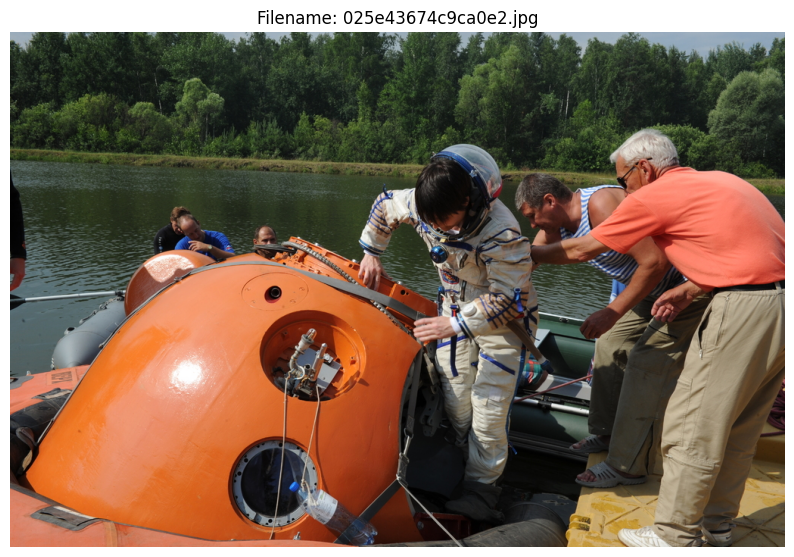

Filename: sample_images/025e43674c9ca0e2.jpg

Common Tags:
boat, crew, equipment, lake, life jacket, lifeboat, man, person, raft, stand, vessel, water

Tags only in ONNX:
motorboat

Tags only in PyTorch:
astronaut, attach, check

Number of ONNX tags: 13
Number of PyTorch tags: 15


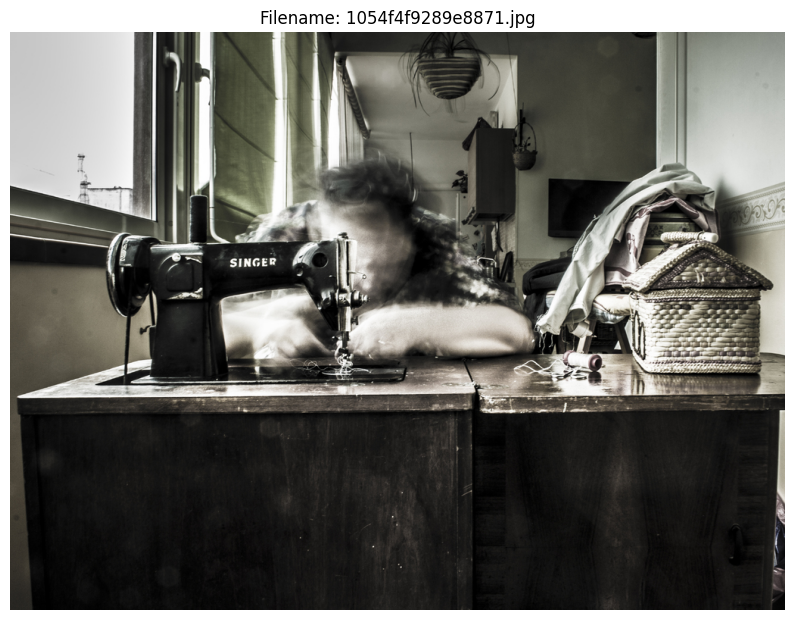

Filename: sample_images/1054f4f9289e8871.jpg

Common Tags:
job, sew, sewing machine, sit, stool, table, woman

Tags only in ONNX:
machine, photo, tailor

Tags only in PyTorch:
cabinet, person

Number of ONNX tags: 10
Number of PyTorch tags: 9


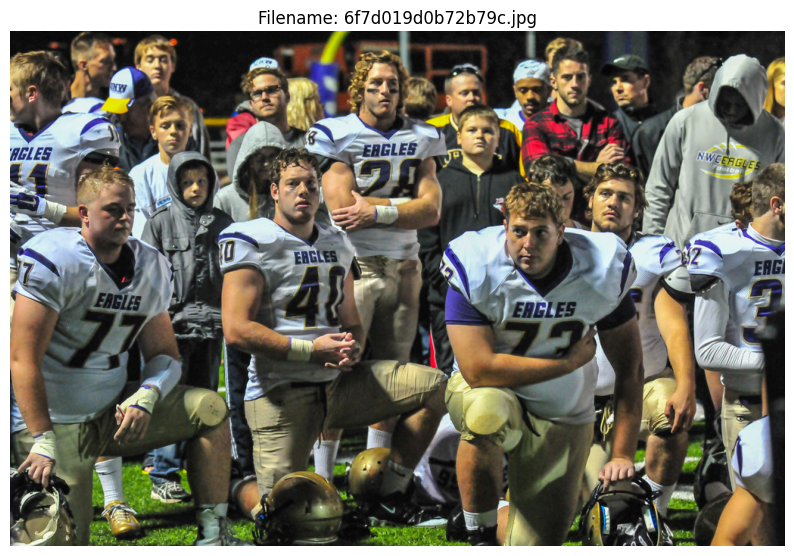

Filename: sample_images/6f7d019d0b72b79c.jpg

Common Tags:
field, football field, football game, football player, football team, game, huddle, man, player, playingfield, sideline, stand, uniform

Tags only in ONNX:
squat

Tags only in PyTorch:


Number of ONNX tags: 14
Number of PyTorch tags: 13


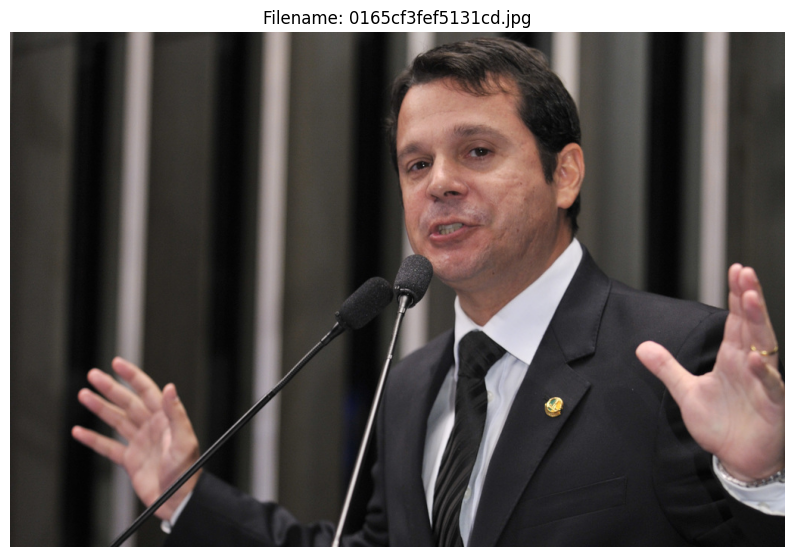

Filename: sample_images/0165cf3fef5131cd.jpg

Common Tags:
business suit, give, hand, man, microphone, speaker, speech, suit, tie, wear

Tags only in ONNX:
deliver

Tags only in PyTorch:
black, stand

Number of ONNX tags: 11
Number of PyTorch tags: 12


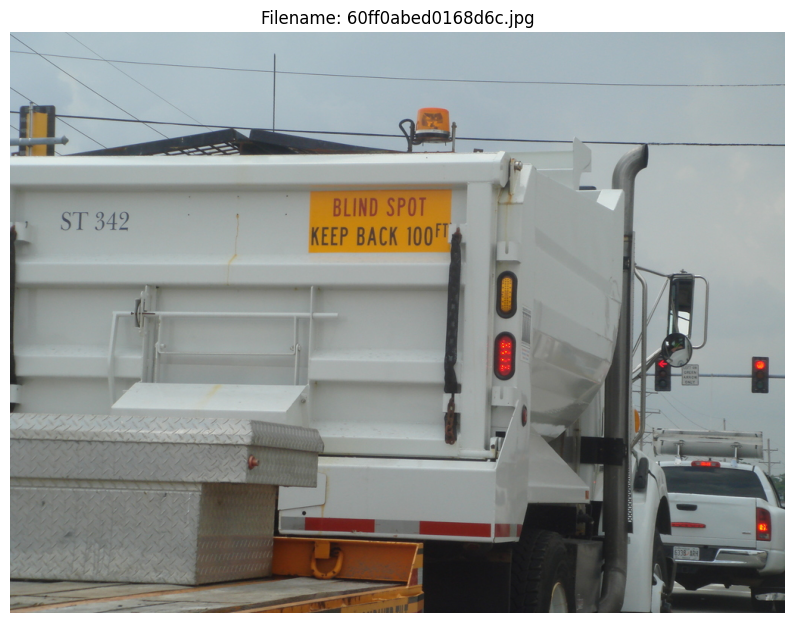

Filename: sample_images/60ff0abed0168d6c.jpg

Common Tags:
back, bin, car, garbage truck, license plate, load, traffic light, truck, white

Tags only in ONNX:
drive, power line, taxi

Tags only in PyTorch:
crate, stop light

Number of ONNX tags: 12
Number of PyTorch tags: 11


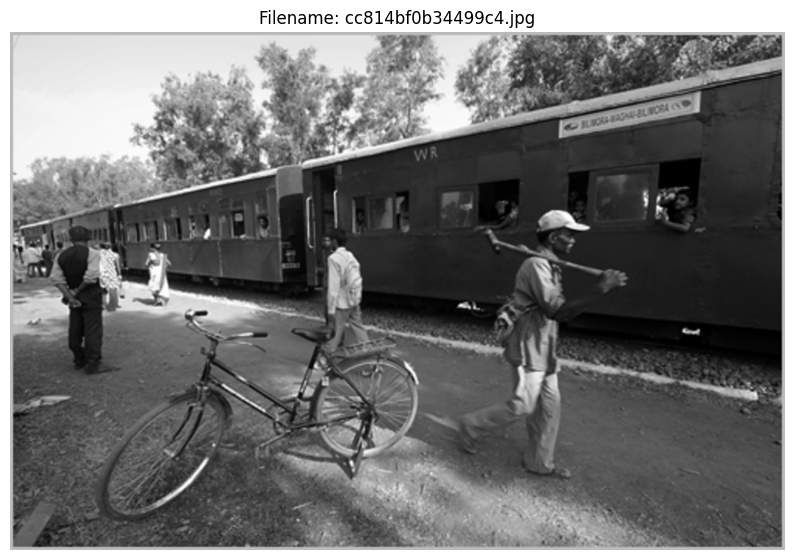

Filename: sample_images/cc814bf0b34499c4.jpg

Common Tags:
bicycle, black, man, passenger train, person, photo, stand, train, train car, train track, white

Tags only in ONNX:
attach, cart, push, railroad

Tags only in PyTorch:
coach, walk

Number of ONNX tags: 15
Number of PyTorch tags: 13


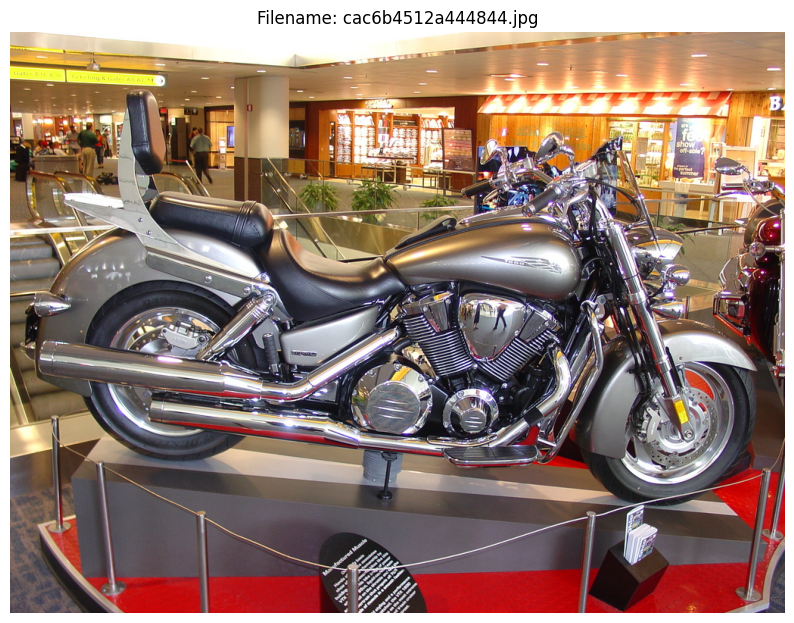

Filename: sample_images/cac6b4512a444844.jpg

Common Tags:
building, carpet, display, mall, motorbike, motorcycle, park, pillar, silver

Tags only in ONNX:
ceiling

Tags only in PyTorch:
department store, showcase, store

Number of ONNX tags: 10
Number of PyTorch tags: 12


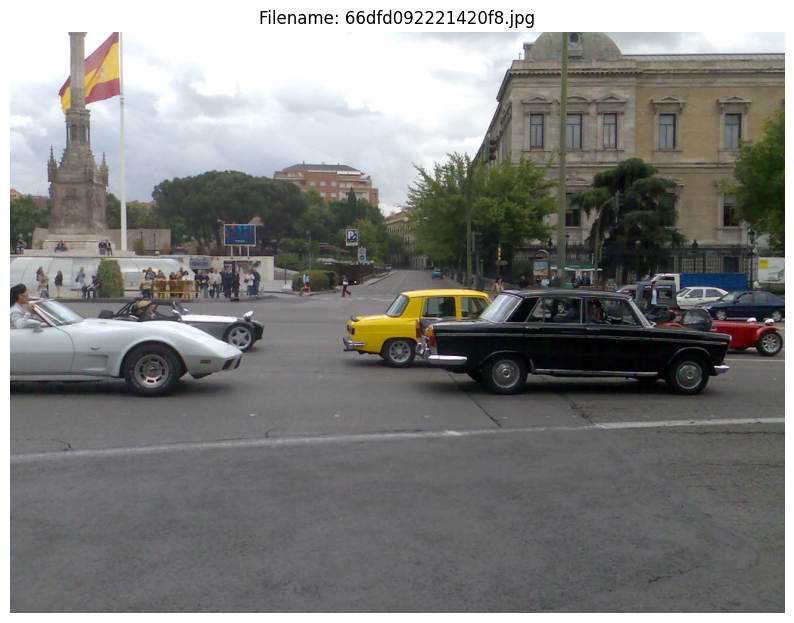

Filename: sample_images/66dfd092221420f8.jpg

Common Tags:
car, car show, classic, convertible, drive, park, pick up, road, sports car

Tags only in ONNX:
building, street scene, taxi, town square, white

Tags only in PyTorch:
flag, motorcycle

Number of ONNX tags: 14
Number of PyTorch tags: 11


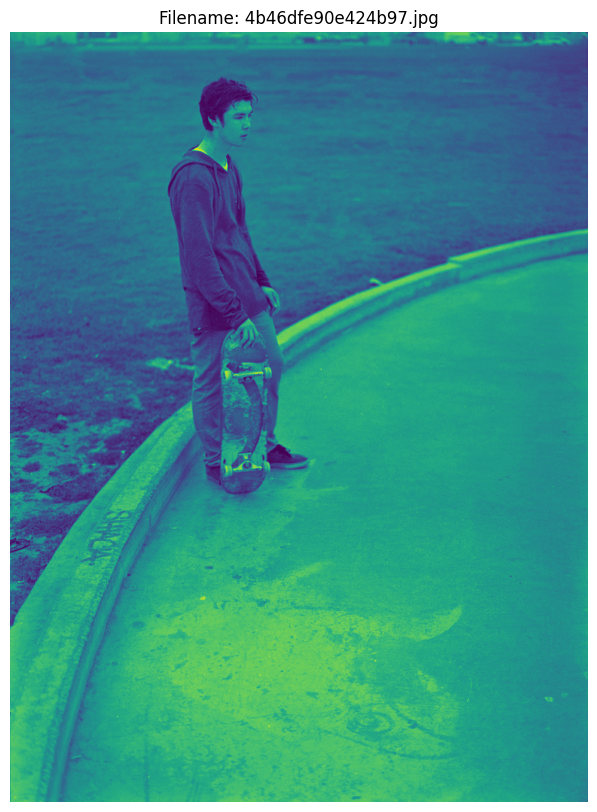

Filename: sample_images/4b46dfe90e424b97.jpg

Common Tags:
black, boy, catch, man, photo, ramp, ride, skate, skate park, skateboard, skateboarder, stand, white

Tags only in ONNX:
curb, ledge, park, trick

Tags only in PyTorch:


Number of ONNX tags: 17
Number of PyTorch tags: 13


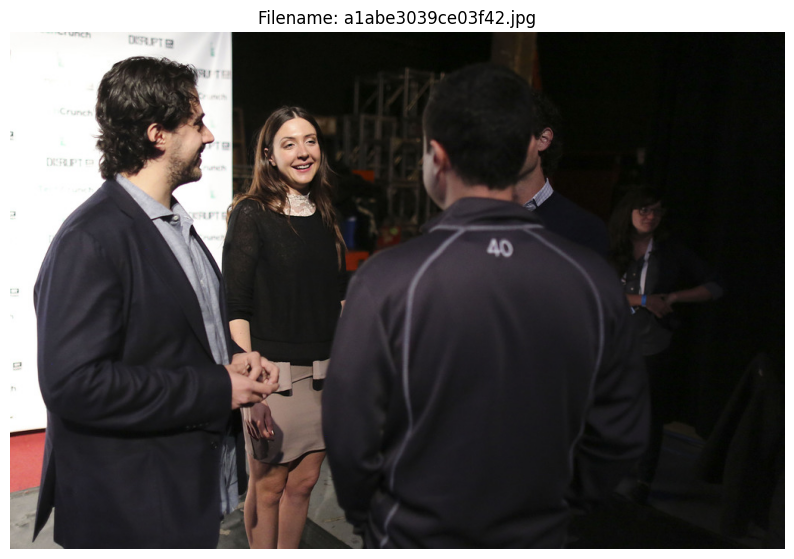

Filename: sample_images/a1abe3039ce03f42.jpg

Common Tags:
convention, conversation, event, hand, laugh, man, person, shake, smile, stand, talk, woman

Tags only in ONNX:
business suit, carpet, greet

Tags only in PyTorch:


Number of ONNX tags: 15
Number of PyTorch tags: 12


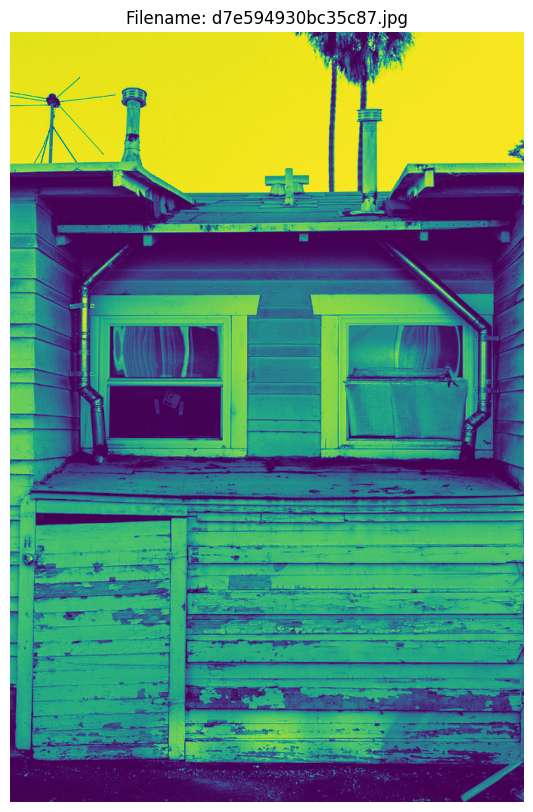

Filename: sample_images/d7e594930bc35c87.jpg

Common Tags:
building, home, house, house exterior, palm tree, photo, white, window

Tags only in ONNX:
chimney

Tags only in PyTorch:
black, hut, out, porch, siding

Number of ONNX tags: 9
Number of PyTorch tags: 13


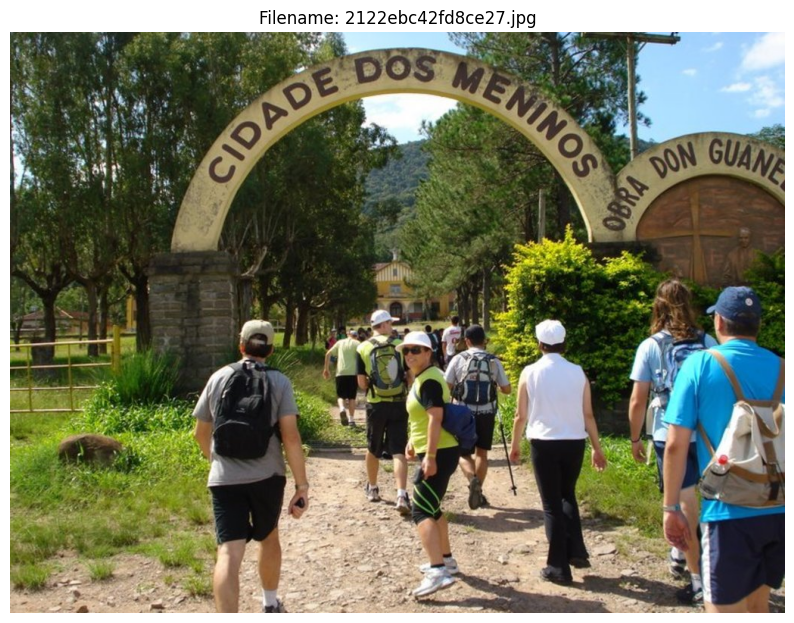

Filename: sample_images/2122ebc42fd8ce27.jpg

Common Tags:
arch, archway, entrance, hike, hiker, path, person, sign, trail, walk

Tags only in ONNX:
attraction

Tags only in PyTorch:


Number of ONNX tags: 11
Number of PyTorch tags: 10


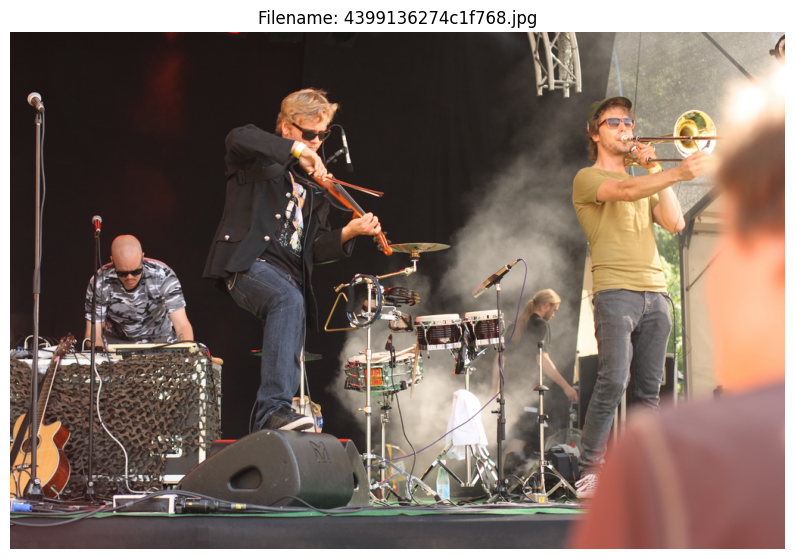

Filename: sample_images/4399136274c1f768.jpg

Common Tags:
band, concert, drum, drummer, instrument, man, music, musician, perform, play, rock band, stage, trumpet

Tags only in ONNX:
festival, flute, person

Tags only in PyTorch:
guitarist, trombone

Number of ONNX tags: 16
Number of PyTorch tags: 15


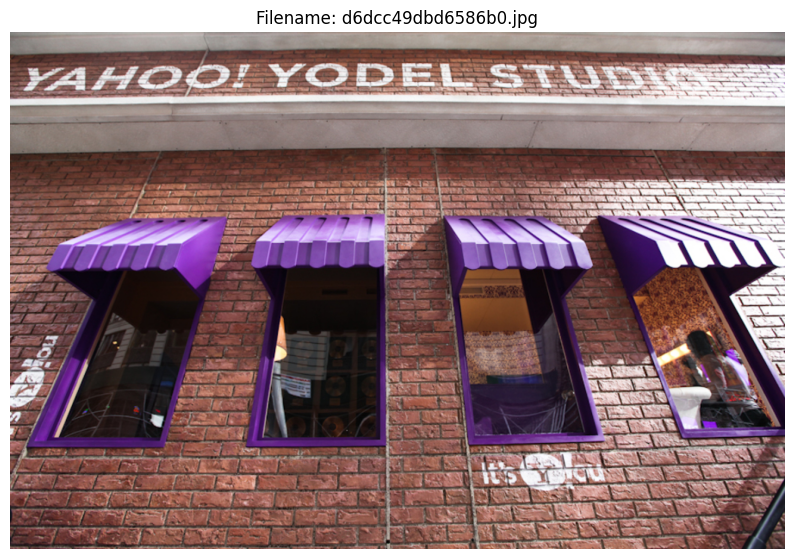

Filename: sample_images/d6dcc49dbd6586b0.jpg

Common Tags:
brick building, building, purple, shed, shop window, store, storefront, window

Tags only in ONNX:
curtain

Tags only in PyTorch:
sign, window display, woman

Number of ONNX tags: 9
Number of PyTorch tags: 11


In [6]:

df['tag_difference'] = df['num_tags_onnx'] - df['num_tags_pytorch']
diff_df = df[df['tag_difference'] != 0]


def display_image_and_tags(filename):
    row = df[df['filename'] == filename].iloc[0]
    
    plt.figure(figsize=(10, 10))
    img = plt.imread("sample_images/"+filename)
    plt.imshow(img)
    plt.axis('off')
    plt.title(f"Filename: {filename}")
    plt.show()
    
    print(f"Filename: sample_images/{filename}")
    
    onnx_tags = set(row['english_tags_onnx'])
    pytorch_tags = set(row['english_tags_pytorch'])
    
    common_tags = onnx_tags.intersection(pytorch_tags)
    only_onnx = onnx_tags - pytorch_tags
    only_pytorch = pytorch_tags - onnx_tags
    
    print("\nCommon Tags:")
    print(", ".join(sorted(common_tags)))
    
    print("\nTags only in ONNX:")
    print(", ".join(sorted(only_onnx)))
    
    print("\nTags only in PyTorch:")
    print(", ".join(sorted(only_pytorch)))
    
    print(f"\nNumber of ONNX tags: {len(onnx_tags)}")
    print(f"Number of PyTorch tags: {len(pytorch_tags)}")

for filename in diff_df['filename'].sample(20):
    display_image_and_tags(filename)

